# Children Book Gen via Custom Diffusion 

In [128]:
from PIL import Image

def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Dataset

We use four images of the same cartoon charactor for training.

In [129]:
img_files = !ls data/cartoon_boy

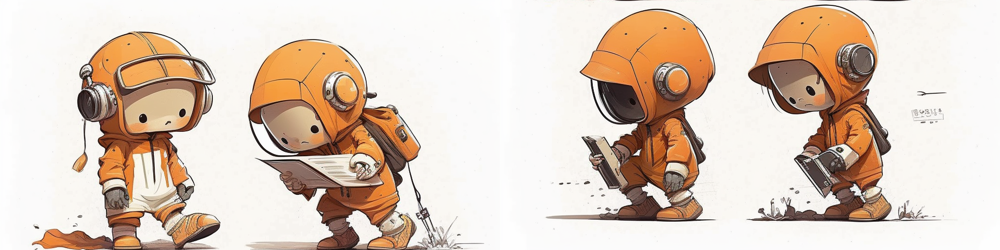

In [132]:
imgs = [Image.open(f'data/cartoon_boy/{im}') for im in img_files]
image_grid(imgs, 1, 4)

## Training

To train custom diffusion we have used [HuggingFace's implementation](https://github.com/huggingface/diffusers/tree/main/examples/custom_diffusion).

We trained by using "runwayml/stable-diffusion-v1-5" base model on one Nvidia 4090 chip with 2500 steps and fp16 mixed precision. In total, it took about 10 minutes.

Command to train:

```bash
$ accelerate launch train_custom_diffusion.py \                                                                
    --pretrained_model_name_or_path="runwayml/stable-diffusion-v1-5"  \
    --instance_data_dir=./data/cartoon_boy \
    --output_dir=./saved_models_boy \
    --instance_prompt="<new2> cartoon character"  \
    --resolution=512  \
    --train_batch_size=1  \
    --learning_rate=1e-5  \
    --lr_warmup_steps=0 \
    --max_train_steps=2500 \
    --scale_lr --hflip  \
    --modifier_token "<new2>
```

We introduced a new token `<new2>` and used prompt "\<new2\> cartoon character" as text condition.

The training output has two files:
- `<new2>.bin`: text embedding for new token `<new2>`
- `pytorch_custom_diffusion_weights.bin`: cross attention weights for K and V matrices.

The image sizes are about 145M and 74M for token embedding and cross attention weights respectively. see below.

In [154]:
! ll saved_models_boy

total 218M
drwxrwxr-x 2 victor victor 4.0K May 17 23:59  checkpoint-1000/
drwxrwxr-x 2 victor victor 4.0K May 18 00:00  checkpoint-1250/
drwxrwxr-x 2 victor victor 4.0K May 18 00:01  checkpoint-1500/
drwxrwxr-x 2 victor victor 4.0K May 18 00:02  checkpoint-1750/
drwxrwxr-x 2 victor victor 4.0K May 18 00:03  checkpoint-2000/
drwxrwxr-x 2 victor victor 4.0K May 18 00:04  checkpoint-2250/
drwxrwxr-x 2 victor victor 4.0K May 17 23:46  checkpoint-250/
drwxrwxr-x 2 victor victor 4.0K May 18 00:05  checkpoint-2500/
drwxrwxr-x 2 victor victor 4.0K May 17 23:57  checkpoint-500/
drwxrwxr-x 2 victor victor 4.0K May 17 23:58  checkpoint-750/
drwxrwxr-x 3 victor victor 4.0K May 17 23:45  logs/
-rw-rw-r-- 1 victor victor 145M May 18 00:05 '<new2>.bin'
-rw-rw-r-- 1 victor victor  74M May 18 00:05  pytorch_custom_diffusion_weights.bin


# Inference

To demonstrate generating consistent images, we presents a story for 5 year-old titled "BBQ on Mars: A Galactic Picnic Adventure" generated by ChatGPT.

We have used following prompts to generate images:

```
- <new2> cartoon character landed on Mars, the red planet.
- <new2> cartoon character is bbq-ing on mars
- On the Martian soil, <new2> cartoon character set up a little music player to play some soft, soothing space tunes."""
- on mars, <new2> cartoon character saw Earth, a tiny blue dot in the vast sea of stars. 
  <new2> cartoon character felt a sense of peace and wonder
```

Here's the story from ChatGPT:

```
Once upon a time, in a world not too far away, there lived a little robot named Beep-Boop-Quark, or BBQ for short. BBQ was not an ordinary robot; he lived on Mars, the red planet. He was a special robot, designed by scientists on Earth to explore Mars and learn about its secrets.

One day, BBQ woke up to a message from Earth. The scientists had a new mission for him. They wanted him to host the first-ever picnic on Mars! BBQ was excited. He had never done anything like this before. He started preparing right away.

First, he needed to find a perfect spot for the picnic. He roamed around the red planet, climbing over hills and valleys, until he found a flat area near a tall, majestic mountain. It was the perfect place for a Martian picnic.

Next, BBQ needed to prepare the food. He couldn't cook like humans, but he had a special compartment where he could store and heat up food sent from Earth. He had Martian marshmallows, space sandwiches, and cosmic cookies. He even had a little grill to make galaxy burgers!

On the day of the picnic, BBQ set up a big, silver picnic blanket on the Martian soil. He arranged the food neatly on the blanket. He even set up a little music player to play some soft, soothing space tunes.

Just as he was finishing up, he saw a bright light in the sky. It was a spaceship from Earth! Out of the spaceship came his friends, the astronaut twins, Luna and Leo. They had been sent from Earth to join BBQ for the picnic.

Luna and Leo were amazed at the sight. They had never seen a picnic like this before. They sat down on the blanket and started eating the delicious space food. They laughed and talked about their adventures in space. BBQ felt happy. He had successfully hosted the first-ever picnic on Mars!

As the sun set, casting long shadows on the Martian landscape, BBQ, Luna, and Leo lay down on the blanket, looking up at the stars. They saw Earth, a tiny blue dot in the vast sea of stars. They felt a sense of peace and wonder.

That night, BBQ went to sleep with a smile on his face. He had not only hosted a successful picnic but also made his friends happy. He realized that even though he was a robot on a distant planet, he could still share joy and create beautiful memories.

And so, the story of the first-ever picnic on Mars was written in the stars, a tale of friendship, adventure, and a little robot named BBQ who made it all possible. From that day forward, BBQ looked forward to many more Martian picnics, each one a new adventure waiting to happen.

And they all lived happily, exploring the red planet, under the twinkling stars, forever and ever. The end.
```

In [155]:
import torch
from diffusers import DiffusionPipeline

pipe = DiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16
).to("cuda")
pipe.unet.load_attn_procs(
    "./saved_models_boy", weight_name="pytorch_custom_diffusion_weights.bin"
)
pipe.load_textual_inversion("saved_models_boy", weight_name="<new2>.bin")

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/100 [00:00<?, ?it/s]

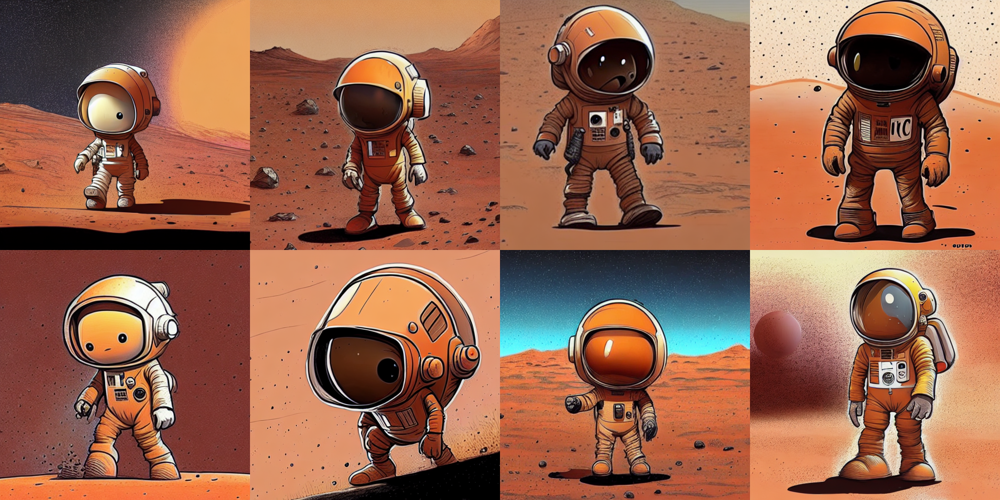

In [156]:
imgaes = pipe(
    "<new2> cartoon character lived on Mars, the red planet.",
    num_inference_steps=100,
    guidance_scale=6.0,
    eta=1.0,
    num_images_per_prompt=8,
).images

image_grid(imgaes, 2, 4)

In [162]:
imgaes[4].save('live.png')

In [165]:
imgaes[4].save('live.png')

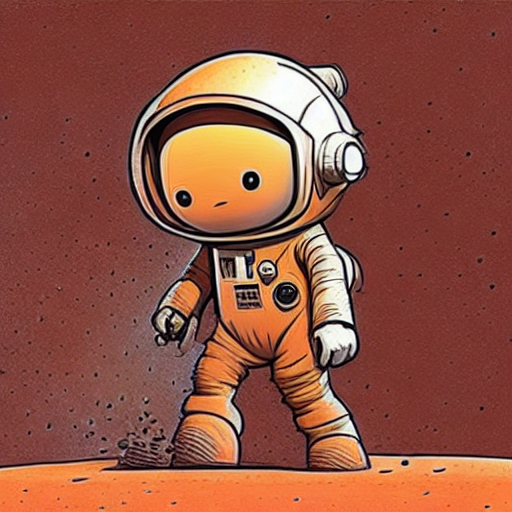

In [166]:
Image.open('live.png')

  0%|          | 0/100 [00:00<?, ?it/s]

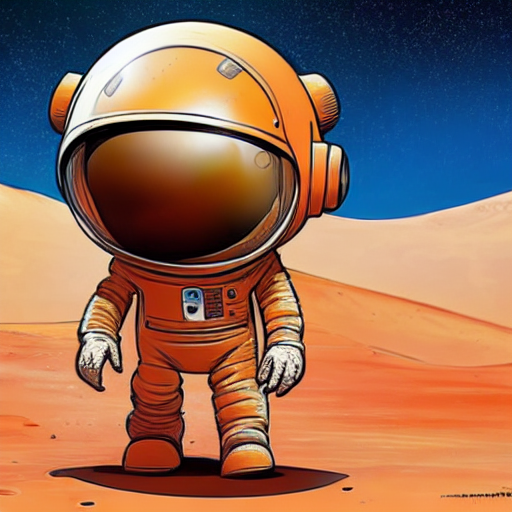

In [142]:
image = pipe(
    "<new2> cartoon character lived on Mars, the red planet.",
    num_inference_steps=100,
    guidance_scale=7.0,
    eta=1.0,
).images[0]

image

  0%|          | 0/100 [00:00<?, ?it/s]

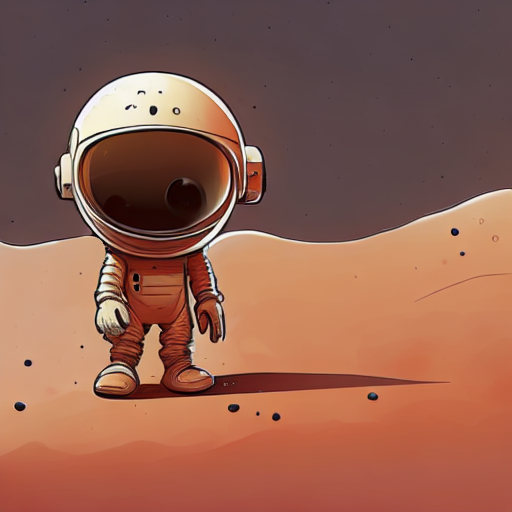

In [144]:
image = pipe(
    "<new2> cartoon character lived on Mars, the red planet.",
    num_inference_steps=100,
    guidance_scale=7.0,
    eta=1.0,
).images[0]

image

  0%|          | 0/100 [00:00<?, ?it/s]

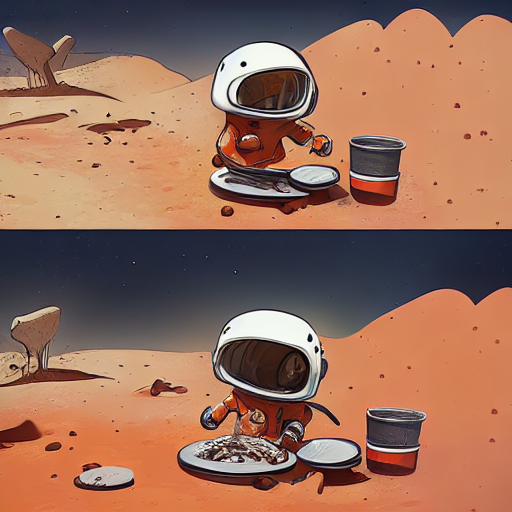

In [51]:
image = pipe(
    "<new2> cartoon character is bbq-ing on mars",
    num_inference_steps=100,
    guidance_scale=6.0,
    eta=1.0,
).images[0]

image

  0%|          | 0/100 [00:00<?, ?it/s]

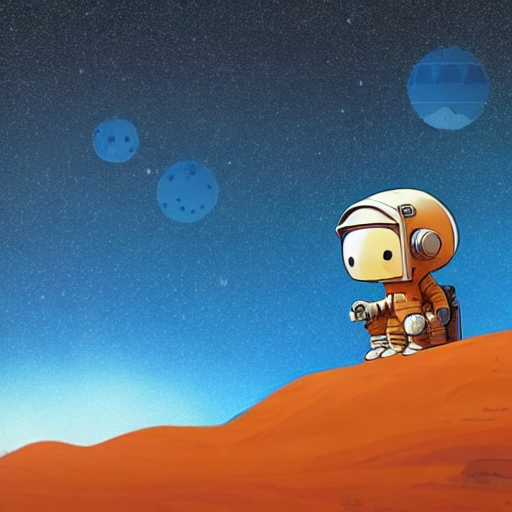

In [70]:
image = pipe(
    """on mars, <new2> cartoon character saw Earth, a tiny blue dot in the vast sea of stars. 
    <new2> cartoon character felt a sense of peace and wonder""",
    num_inference_steps=100,
    guidance_scale=7.0,
    eta=1.0,
).images[0]

image

  0%|          | 0/100 [00:00<?, ?it/s]

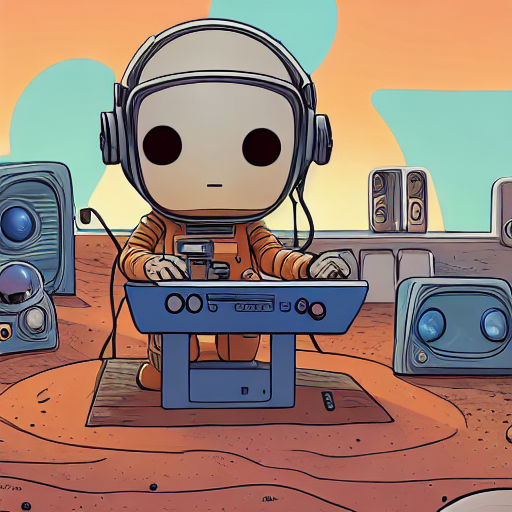

In [73]:
image = pipe(
    """
    on the Martian soil, <new2> cartoon character set up a little music player to play some soft, soothing space tunes.""",
    num_inference_steps=100,
    guidance_scale=7.0,
    eta=1.0,
).images[0]

image

  0%|          | 0/100 [00:00<?, ?it/s]

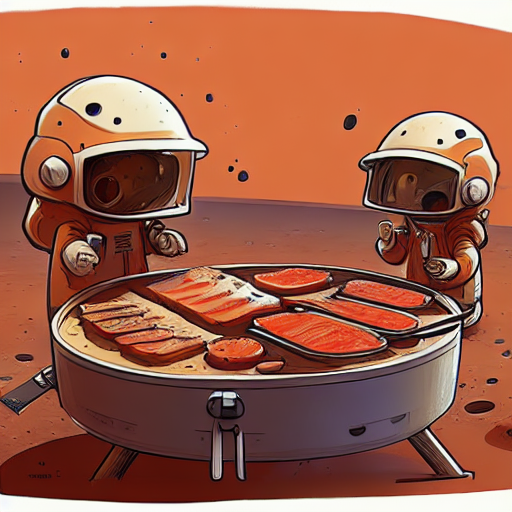

In [85]:
image = pipe(
    """
    <new2> cartoon character is bbq-ing on mars""",
    num_inference_steps=100,
    guidance_scale=7.0,
    eta=1.0,
).images[0]

image

In [151]:
imgs = pipe(
    """<new2> cartoon character is bbq-ing on mars""",
    num_inference_steps=100,
    guidance_scale=6.0,
    eta=1.0,
    num_images_per_prompt=8,
).images


  0%|          | 0/100 [00:00<?, ?it/s]

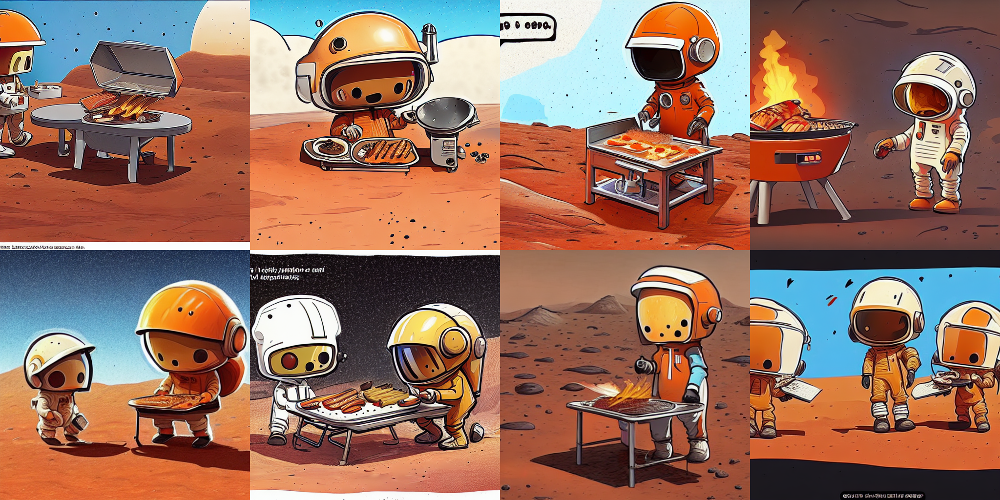

In [108]:
image_grid(imgs, 2, 4)

In [167]:
images = pipe(
    "<new2> cartoon character found water on mars",
    num_inference_steps=100,
    guidance_scale=6.0,
    eta=1.0,
    num_images_per_prompt=8,
).images



  0%|          | 0/100 [00:00<?, ?it/s]

[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>]

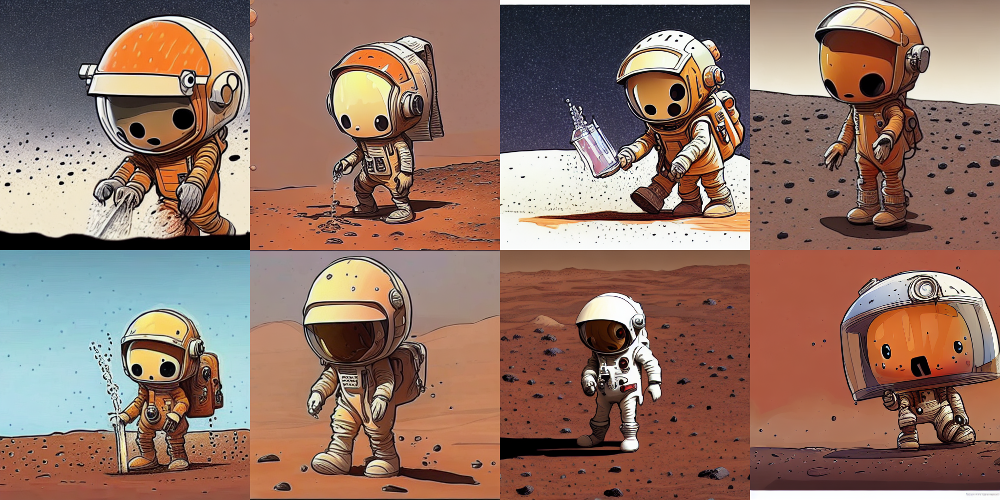

In [168]:
image_grid(images, 2, 4)